## SINGLE SHOT DETECTOR (SSD300)

1. SSDs are a popular and efficient method for object detection. One of the key features of SSDs is that they use CNN to predict bounding boxes and class labels for objects in an image. 

2. Generally, the architecture of an SSD typically consists of a base network, such as VGG or ResNet, that is pre-trained on a large image classification dataset, such as ImageNet. This base network is then followed by several additional layers, known as the “extra layers,” that are added on top of the base network. These extra layers are responsible for detecting objects at different scales and are typically composed of convolutional and pooling layers:

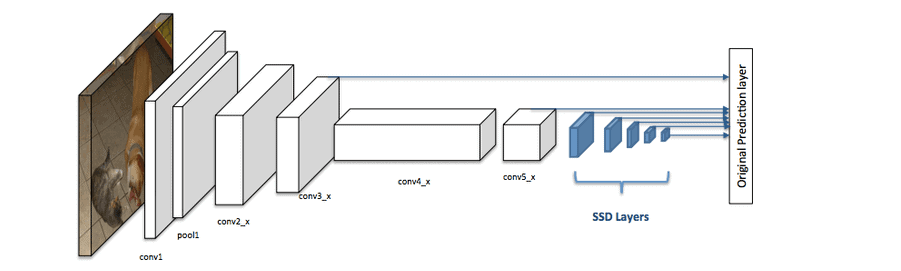

3. One of the main advantages of SSDs is their speed and efficiency. Because they use a single network, they can detect objects in real-time, making them suitable for applications such as self-driving cars and surveillance systems.

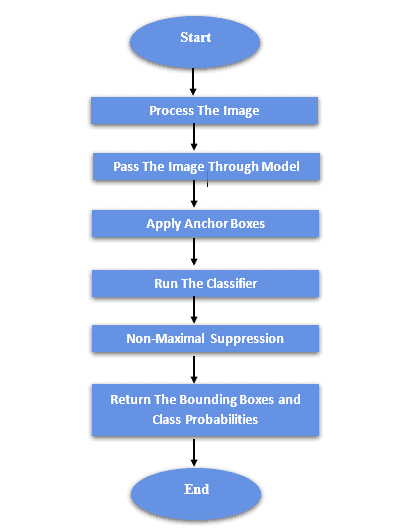

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os, cv2
import xml.etree.ElementTree as ET
import tensorflow as tf
from tensorflow import keras
from keras import Sequential, Model
import time
from tensorflow.keras.losses import Loss
from tensorflow.keras import backend as K

### Image and Label Preprocessing

1. There are 20 classes in the PASCAL VOC dataset, and 1 extra class (None) will be added to refer the background class indicating presence og no object.

2. The image and all the ground truth bounding boxes will be rescaled to (300,300,3) size i.e why SSD300.

3. Since we are concerned with object detection i will be modifying the data to 2 classes only i.e 0 or 1 indicating whether object is present or not.

In [2]:
LABELS = ['None','aeroplane',  'bicycle', 'bird',  'boat',      'bottle', 
          'bus',        'car',      'cat',  'chair',     'cow',
          'diningtable','dog',    'horse',  'motorbike', 'person',
          'pottedplant','sheep',  'sofa',   'train',   'tvmonitor']

train_image_folder = "JPEGImages/"
train_annot_folder = "Annotations/"

In [3]:
def parse_annotation(ann_dir, img_dir, labels=[]):
    '''
    output:
    - Each element of the train_image is a dictionary containing the annoation infomation of an image.
    - seen_train_labels is the dictionary containing
            (key, value) = (the object class, the number of objects found in the images)
    '''
    all_imgs = []
    seen_labels = {}
    
    for ann in sorted(os.listdir(ann_dir)):
        if "xml" not in ann:
            continue
        img = {'object':[]}

        tree = ET.parse(ann_dir + ann)
        
        for elem in tree.iter():
            if 'filename' in elem.tag:
                path_to_image = img_dir + elem.text
                img['filename'] = path_to_image
                ## make sure that the image exists:
                if not os.path.exists(path_to_image):
                    assert False, "file does not exist!\n{}".format(path_to_image)
            if 'width' in elem.tag:
                img['width'] = int(elem.text)
            if 'height' in elem.tag:
                img['height'] = int(elem.text)
            if 'object' in elem.tag or 'part' in elem.tag:
                obj = {}
                
                for attr in list(elem):
                    if 'name' in attr.tag:
                        
                        obj['name'] = attr.text
                        
                        if len(labels) > 0 and obj['name'] not in labels:
                            break
                        else:
                            img['object'] += [obj]
                            
                        

                        if obj['name'] in seen_labels:
                            seen_labels[obj['name']] += 1
                        else:
                            seen_labels[obj['name']]  = 1
                        

                            
                    if 'bndbox' in attr.tag:
                        for dim in list(attr):
                            if 'xmin' in dim.tag:
                                obj['xmin'] = int(round(float(dim.text)))
                            if 'ymin' in dim.tag:
                                obj['ymin'] = int(round(float(dim.text)))
                            if 'xmax' in dim.tag:
                                obj['xmax'] = int(round(float(dim.text)))
                            if 'ymax' in dim.tag:
                                obj['ymax'] = int(round(float(dim.text)))

        if len(img['object']) > 0:
            all_imgs += [img]
                        
    return all_imgs, seen_labels

## Parse annotations 
train_image, seen_train_labels = parse_annotation(train_annot_folder,train_image_folder, labels=LABELS)
print("N train = {}".format(len(train_image)))

N train = 17125


In [4]:
# Rescaling image and bounding boxes to 300,300 dimension.

def fun(x,H,W):
    
    w = x['width']
    h = x['height']
    
    attr = []
    for i in x['object']:
        
        t = {}
        
        xmin = i['xmin']*W/w
        xmax = i['xmax']*W/w
        
        ymin = i['ymin']*H/h
        ymax = i['ymax']*H/h
        
        name = i['name']
        
        t['name'] = name
        t['xmin'] = xmin
        t['ymin'] = ymin
        t['xmax'] = xmax
        t['ymax'] = ymax
        
        attr.append(t)
    
    image = cv2.imread(x['filename'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image,(W,H))
    image = image/255
    
    return image,attr

In [5]:
target_coord = []
target_labels = []
images = []

def fun_binary(x):  
    if x ==0:
        return 0       # background class
    if x!=0:
        return 1     # The following class converts all the class labels from 1 to 20 (each indicating different class object like dog,cat,etc.) to 1. 

for j in range(1000):
    
    img,attr = fun(train_image[j],300,300)     # (300,300,3)
    
    coord  = []
    labels = []

    for i in attr:
        
        xmin,ymin,xmax,ymax,label = i['xmin'],i['ymin'],i['xmax'],i['ymax'],i['name']
        
        label = fun_binary(LABELS.index(label))   # 0 or 1
        labels.append(label)
        
        coord.append([xmin ,ymin ,xmax ,ymax,label])

    target_coord.append(coord)

    images.append(img)
    
images = np.array(images)

## Anchor Boxes

1. Anchor boxes are predifined collection of boxes into which the ground truth labels will be mapped. The anchor boxes encompass a variety widths, heights and aspect ratios to match the possible ground truth label for objects in a dataset. 

2. For the VGG16-Single Shot Detector architecture 8732 anchor boxes are generated, Figure 1 shows just the 2% of all the anchor boxes generated for the VVG16-Single Shot Detector.

3. The advantage of anchor boxes is that you can evaluate all object predictions at once. Anchor boxes eliminate the need for scanning an image or making multiple passes throungh the model for each area of interest.

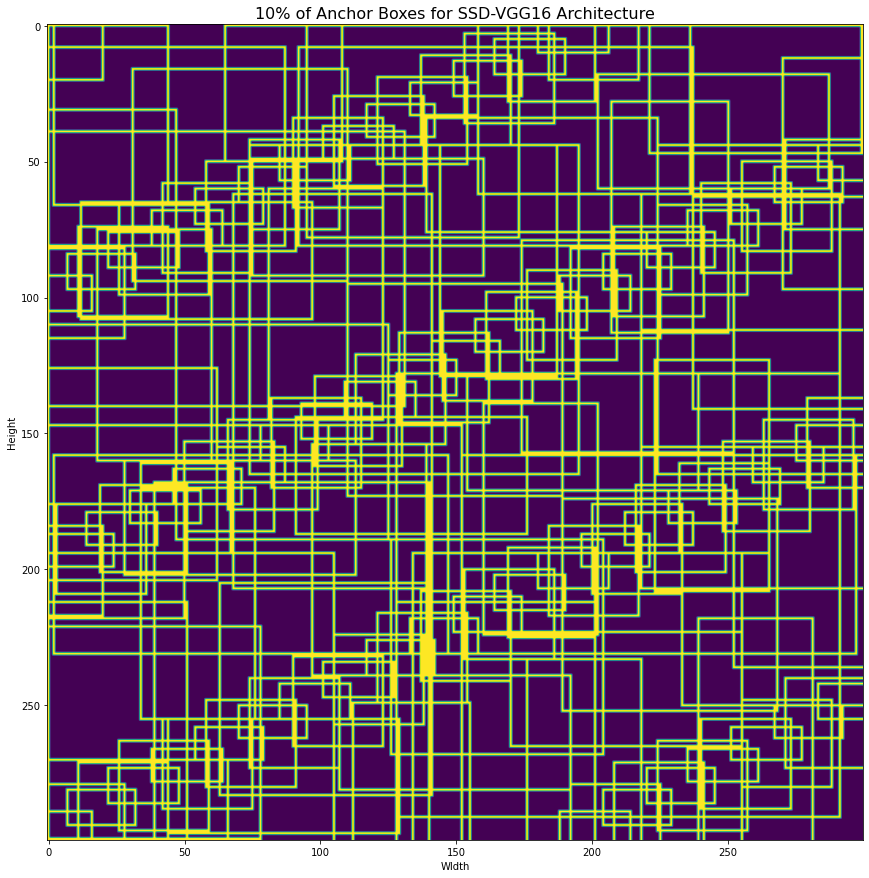

The SSD paper explains that these feature maps will have different receptive field sizes, the anchor boxes we will generate don’t need to exactly corresond to the actual receptive fields. The paper presents a method to generate anchor “boxes so that specific feature maps learn to be responsive to particular scales of the objects.”

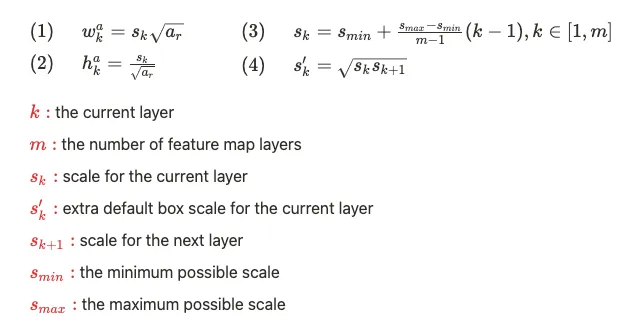

For conv4_3, conv10_2 and conv11_2, we only associate 4 default boxes at each feature map location – omitting aspect ratios of 1/3 and 3. For all other layers, we put 6 default boxes (1, 2, 3, 2/3 , 1/3).

In [6]:
from itertools import product
from math import sqrt

cfg = {
    'feature_maps':[38, 19, 10, 5, 3, 1],
    'min_dim': 300, #
    'steps': [8, 16, 32, 64, 100, 300], #
    'min_sizes': [30, 60, 111, 162, 213, 264], #
    'max_sizes': [60, 111, 162, 213, 264, 315], #
    'aspect_ratios': [[2], [2, 3], [2, 3], [2, 3], [2], [2]], #
    'variance': [0.1, 0.2], #
    'clip': True, #
}

class PriorBox(tf.Module):
    def __init__(self, cfg):
        super().__init__()
        self.image_size = cfg['min_dim']
        self.num_priors = len(cfg['aspect_ratios'])
        self.variance = cfg['variance'] or [0.1]
        self.feature_maps = cfg['feature_maps']
        self.min_sizes = cfg['min_sizes']
        self.max_sizes = cfg['max_sizes']
        self.steps = cfg['steps']
        self.aspect_ratios = cfg['aspect_ratios']
        self.clip = cfg['clip']
        for v in self.variance:
            if v <= 0:
                raise ValueError('Variances must be greater than 0')

    def __call__(self):
        mean = []
        for k, f in enumerate(self.feature_maps):
            for i, j in product(range(f), repeat=2):
                f_k = self.image_size / self.steps[k]
                cx = (j + 0.5) / f_k
                cy = (i + 0.5) / f_k

                s_k = self.min_sizes[k] / self.image_size
                mean.append([cx, cy, s_k, s_k])

                s_k_prime = sqrt(s_k * (self.max_sizes[k] / self.image_size))
                mean.append([cx, cy, s_k_prime, s_k_prime])

                for ar in self.aspect_ratios[k]:
                    mean.append([cx, cy, s_k * sqrt(ar), s_k / sqrt(ar)])
                    mean.append([cx, cy, s_k / sqrt(ar), s_k * sqrt(ar)])

        output = tf.constant(mean, dtype=tf.float32)
        if self.clip:
            output = tf.clip_by_value(output, clip_value_min=0, clip_value_max=1)
        return output

priorbox = PriorBox(cfg)
priors = priorbox()
priors

2024-06-17 16:18:42.766847: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2024-06-17 16:18:42.766868: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 24.00 GB
2024-06-17 16:18:42.766873: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 8.00 GB
2024-06-17 16:18:42.766904: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-06-17 16:18:42.766923: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


<tf.Tensor: shape=(8732, 4), dtype=float32, numpy=
array([[0.01333333, 0.01333333, 0.1       , 0.1       ],
       [0.01333333, 0.01333333, 0.14142136, 0.14142136],
       [0.01333333, 0.01333333, 0.14142136, 0.07071068],
       ...,
       [0.5       , 0.5       , 0.9612492 , 0.9612492 ],
       [0.5       , 0.5       , 1.        , 0.62225395],
       [0.5       , 0.5       , 0.62225395, 1.        ]], dtype=float32)>

In [7]:
def convert_scale(matrix,scale,hImage,wImage):
    if scale == 'abs':
        return tf.stack([matrix[:,0]*wImage,
        matrix[:,1]*hImage,
        matrix[:,2]*wImage,
        matrix[:,3]*hImage],axis=-1)

    elif scale == 'rel':
        return tf.stack([matrix[:,0]/wImage,
        matrix[:,1]/hImage,
        matrix[:,2]/wImage,
        matrix[:,3]/hImage],axis=-1)    

    
def convert_format(out,format):
    if format == 'x1y1x2y2':
        return tf.stack([out[...,0]-out[...,2]/2.0,
        out[...,1]-out[...,3]/2.0,
        out[...,0]+out[...,2]/2.0,
        out[...,1]+out[...,3]/2.0]
        ,axis=-1)

    elif format == 'xywh':
        return tf.stack([(out[...,0]+out[...,2])/2.0,
        (out[...,1]+out[...,3])/2.0,
        out[...,2]-out[...,0],
        out[...,3]-out[...,1],
        out[...,4]],axis=-1)

In [8]:
# Our generated prior boxes are from 0 to 1 in range. We need to multiply with the scale of our image i.e 300

feature_box = convert_scale(priors,'abs',300,300)
feature_box_conv = convert_format(feature_box,'x1y1x2y2')

feature_box_conv = tf.clip_by_value(feature_box_conv, clip_value_min=0, clip_value_max=300)

feature_box_conv

<tf.Tensor: shape=(8732, 4), dtype=float32, numpy=
array([[  0.      ,   0.      ,  19.      ,  19.      ],
       [  0.      ,   0.      ,  25.213205,  25.213205],
       [  0.      ,   0.      ,  25.213205,  14.606603],
       ...,
       [  5.812622,   5.812622, 294.18738 , 294.18738 ],
       [  0.      ,  56.661903, 300.      , 243.3381  ],
       [ 56.661903,   0.      , 243.3381  , 300.      ]], dtype=float32)>

In [9]:
def iou(box1, box2):
    """
    Calculate the Intersection over Union (IoU) of two sets of boxes.
    The IoU is a measure of the overlap between two bounding boxes.

    Args:
    box1 -- tensor of shape (N, 4), ground truth bounding boxes
    box2 -- tensor of shape (M, 4), proposed anchor boxes

    Returns:
    iou -- tensor of shape (N, M), IoU values
    """
    # Convert boxes to float32 for precision during division
    box1 = tf.cast(box1, dtype=tf.float32)
    box2 = tf.cast(box2, dtype=tf.float32)

    # Calculate intersection coordinates
    x1 = tf.math.maximum(box1[:, None, 0], box2[:, 0])
    y1 = tf.math.maximum(box1[:, None, 1], box2[:, 1])
    x2 = tf.math.minimum(box1[:, None, 2], box2[:, 2])
    y2 = tf.math.minimum(box1[:, None, 3], box2[:, 3])

    # Compute area of intersection rectangle
    intersectionArea = tf.math.maximum(0.0, x2 - x1) * tf.math.maximum(0.0, y2 - y1)

    # Compute area of both bounding boxes
    box1Area = (box1[:, 2] - box1[:, 0]) * (box1[:, 3] - box1[:, 1])
    box2Area = (box2[:, 2] - box2[:, 0]) * (box2[:, 3] - box2[:, 1])

    # Compute union area by using inclusion-exclusion principle
    unionArea = tf.math.maximum(1e-10, box1Area[:, None] + box2Area - intersectionArea)

    # Compute IoU by dividing intersection area by union area
    iou = intersectionArea / unionArea

    # Clip the values to be between 0 and 1 as IoU cannot exceed 1
    return tf.clip_by_value(iou, 0.0, 1.0)



def df_match(labels, iou_matrix):
    """
    Match each proposed anchor box with the ground truth box that has the highest IoU.

    Args:
    labels -- tensor of shape (K, 4), ground truth labels
    iou_matrix -- tensor of shape (N, K), IoU values for each anchor against each ground truth

    Returns:
    gt_box -- tensor of shape (N, 4), matched ground truth boxes for each anchor
    matched -- tensor of shape (N,), indicator whether matching IoU is above threshold
    """
    
    # Find the maximum IoU value for each anchor box and its corresponding ground truth box index
    max_values = tf.reduce_max(iou_matrix,axis=1)
    max_idx = tf.math.argmax(iou_matrix,axis=1) 

    # Determine if the maximum IoU value for each anchor is above the threshold (0.5 in this case)
    matched = tf.cast(tf.math.greater_equal(max_values,0.5),dtype=tf.float32) 

    # Gather the matched ground truth boxes based on the indices from max_idx
    gt_box = tf.gather(labels,max_idx) 

    return gt_box, matched


# Explanation:

#  1. suppose if there are 4 GT boxes in an image it find iou of all those 4 boxes with all our propose anchor boxes hence creting a matrix of 
#     shape (len(anchor_boxes),4)

#  2. now from the matrix we get obtain 2 things, the max iou score out of the 4 columns and the column index with the max iou score. 
#     it eseentially gives us that GT box which is closest to a proposed anchor box and the iou score. so if for anchor box number 5000 if the 3rd GT box 
#     has the highest iou it will be selected and the score. the score then will be mapped to 0 or 1 as if it is above a certain threshold or not.


Object predictions can be quite diverse. They can occur at any position, with any size and shape. There are infinite possibilities for where and how an object can occur. While this may be true mathematically, many options are simply improbable or uninteresting. Furthermore, we needn't insist that boxes are pixel-perfect.

In effect, we can discretize the mathematical space of potential predictions into just thousands of possibilities.

Priors are precalculated, fixed boxes which collectively represent this universe of probable and approximate box predictions.

Priors are manually but carefully chosen based on the shapes and sizes of ground truth objects in our dataset. By placing these priors at every possible location in a feature map, we also account for variety in position.


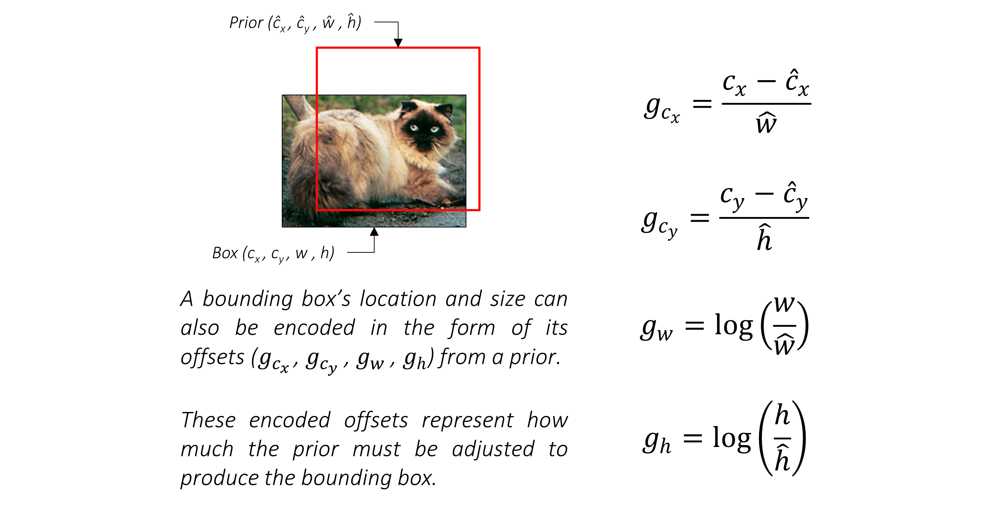

Considering that each prior is adjusted to obtain a more precise prediction, these four offsets (g_c_x, g_c_y, g_w, g_h) are the form in which we will regress bounding boxes' coordinates.

As you can see, each offset is normalized by the corresponding dimension of the prior. This makes sense because a certain offset would be less significant for a larger prior than it would be for a smaller prior.

In [10]:
import tensorflow as tf

def normalised_ground_truth(matched_boxes, feature_box, return_format):
    
    """Normalizes ground truth boxes based on the anchor box dimensions.

    This function encodes or decodes ground truth boxes relative to the provided 
    anchor boxes. The encoding and decoding processes are essential for training
    the SSD model.

    Args:
    matched_boxes: A tensor of shape [N, 4] representing the ground truth boxes 
      that have been matched to the anchor boxes.
    feature_box: A tensor of shape [1, 4] representing the anchor box 
      dimensions.
    return_format: A string indicating the desired output format. 
      "encode": Returns encoded boxes.
      "decode": Returns decoded boxes.

    Returns:
    A tensor of shape [N, 4] representing the encoded or decoded ground truth 
    boxes.
    """

    # Convert data types to float32
    matched_boxes = tf.cast(matched_boxes,tf.float32)
    feature_box = tf.cast(feature_box,tf.float32)

    if return_format == "encode":
        
        """
        Encoding ground truth boxes:

        This process transforms the ground truth boxes into relative offsets and 
        scale factors with respect to the anchor box. The offsets are normalized 
        by dividing them by the anchor box's width and height. The scale factors are 
        represented as the logarithm of the ratio between the ground truth box's 
        width/height and the anchor box's width/height.

        The normalized values are then further scaled by constants (0.1 for 
        offsets and 0.2 for scale factors) to ensure stability during training.
        """
        x_offset = (matched_boxes[:, 0] - feature_box[:, 0]) / feature_box[:, 2]
        y_offset = (matched_boxes[:, 1] - feature_box[:, 1]) / feature_box[:, 3]
        w_scale = tf.math.log(matched_boxes[:, 2] / feature_box[:, 2])
        h_scale = tf.math.log(matched_boxes[:, 3] / feature_box[:, 3])

        encoded_boxes = tf.stack([x_offset, y_offset, w_scale, h_scale], axis=-1)
        return encoded_boxes / [0.1, 0.1, 0.2, 0.2]

    elif return_format == "decode":
        
        """
        Decoding ground truth boxes:

        This process reverses the encoding process to obtain the original ground
        truth boxes from the encoded values. It involves:
        - Reversing the scaling applied during encoding.
        - Using the encoded values to calculate the center coordinates (x_center,
        y_center) and width (w) and height (h) of the boxes relative to the anchor 
        box.
        - Applying the exponential function to the scale factors to recover the 
        original width and height ratios.
        - Finally, multiplying the calculated dimensions by the anchor box's width 
        and height to obtain the absolute dimensions of the ground truth box.
        """
        encoded_boxes = matched_boxes * [0.1, 0.1, 0.2, 0.2]
        x_center = encoded_boxes[:, 0] * feature_box[:, 2] + feature_box[:, 0]
        y_center = encoded_boxes[:, 1] * feature_box[:, 3] + feature_box[:, 1]
        w = tf.math.exp(encoded_boxes[:, 2]) * feature_box[:, 2]
        h = tf.math.exp(encoded_boxes[:, 3]) * feature_box[:, 3]

        decoded_boxes = tf.stack([x_center, y_center, w, h], axis=-1)
        return decoded_boxes



1. **Encoding Ground Truth Boxes:**
   - The `encode` mode calculates the relative offsets of the ground truth box's center coordinates (x_offset, y_offset) from the anchor box's center coordinates.
   - It then calculates the logarithmic scale factors (w_scale, h_scale) representing the ratio between the ground truth box's width/height and the anchor box's width/height.
   - These offsets and scale factors are normalized by dividing them by specific constants (0.1 for offsets, 0.2 for scale factors).

2. **Decoding Ground Truth Boxes:**
   - The `decode` mode reverses the encoding process. 
   - It first reverses the normalization applied during encoding.
   - It then uses the encoded values to calculate the absolute coordinates and dimensions of the ground truth box based on the anchor box's dimensions.
   - The exponential function is applied to the scale factors to recover the original width and height ratios.

**In the context of SSD300:**

- This function is used during the training process to convert ground truth bounding boxes into a format that can be used to train the SSD model. 
- The model learns to predict the encoded offsets and scale factors for each anchor box, which are then used to generate the final bounding box predictions. 
- During inference, the encoded predictions are decoded to obtain the final bounding box predictions. 


**Overall, this function plays a crucial role in the SSD model's training and inference by enabling the model to learn and predict object locations and sizes effectively.** 


In [11]:
def main(label):
    
    iou_matrix = iou(feature_box_conv, label)
    gt_box, matched = df_match(convert_format(label, 'xywh'), iou_matrix)
    boxes = gt_box[:, :4]
    classes = gt_box[:, 4]

    classes = tf.cast(classes, dtype=tf.int32)  
    matched = tf.cast(matched, dtype=tf.int32)
    classes = tf.cast(classes * matched, dtype=tf.int32)
    classes = tf.one_hot(classes, depth=1, dtype=tf.float32)
    normalised_gtbox = normalised_ground_truth(boxes, feature_box, 'encode')
    df_box = tf.concat((normalised_gtbox, classes), axis=-1)
    df_box.set_shape([feature_box.shape[0], 4 + 1])
    return df_box

In [12]:
final_coord = []
for i in range(len(images)):
    coord_ = main(np.array(target_coord[i]))
    final_coord.append(coord_)
    
final_coord =  tf.cast(final_coord,tf.float32)
final_coord

<tf.Tensor: shape=(1000, 8732, 5), dtype=float32, numpy=
array([[[ 5.2473248e+01,  4.3866669e+01,  6.4058118e+00,  8.0471897e+00,
          1.0000000e+00],
        [ 3.7104187e+01,  3.1018417e+01,  4.6729441e+00,  6.3143210e+00,
          1.0000000e+00],
        [ 3.7104187e+01,  6.2036835e+01,  4.6729441e+00,  9.7800570e+00,
          1.0000000e+00],
        ...,
        [ 3.9600393e-01, -4.9935001e-01, -4.9095054e+00, -3.2681277e+00,
          1.0000000e+00],
        [ 3.8065848e-01, -7.7138883e-01, -5.1071129e+00, -1.0937014e+00,
          1.0000000e+00],
        [ 6.1174130e-01, -4.7999978e-01, -2.7350788e+00, -3.4657359e+00,
          1.0000000e+00]],

       [[ 4.6566666e+01,  4.5107944e+01,  8.4504795e+00,  6.5909538e+00,
          1.0000000e+00],
        [ 3.2927601e+01,  3.1896132e+01,  6.7176108e+00,  4.8580856e+00,
          1.0000000e+00],
        [ 3.2927601e+01,  6.3792263e+01,  6.7176108e+00,  8.3238211e+00,
          1.0000000e+00],
        ...,
        [-2.1846583e-01,

## LOSS

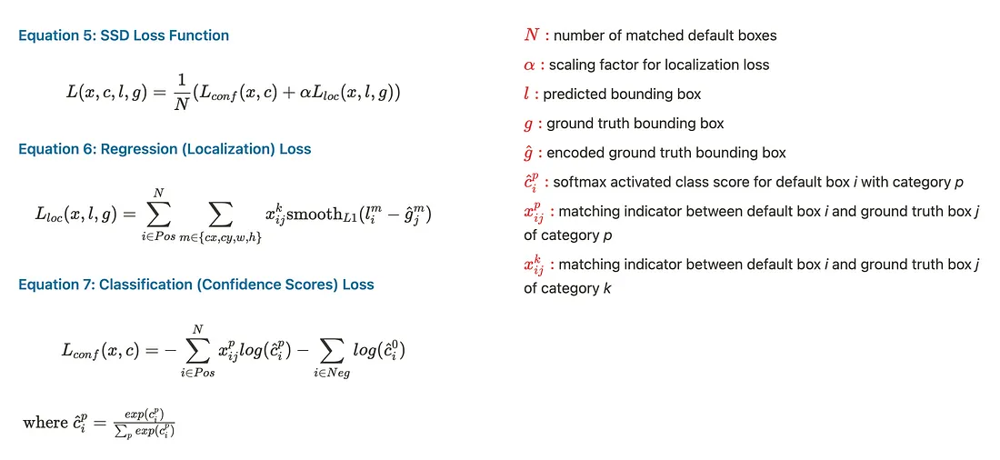

#### Localization loss

We have no ground truth coordinates for the negative matches. This makes perfect sense. Why train the model to draw boxes around empty space?

Therefore, the localization loss is computed only on how accurately we regress positively matched predicted boxes to the corresponding ground truth coordinates.

Since we predicted localization boxes in the form of offsets (g_c_x, g_c_y, g_w, g_h), we would also need to encode the ground truth coordinates accordingly before we calculate the loss.

The localization loss is the averaged Smooth L1 loss between the encoded offsets of positively matched localization boxes and their ground truths.

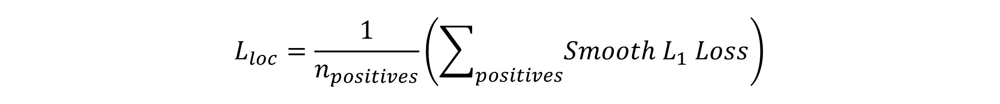


#### Confidence loss

1. Every prediction, no matter positive or negative, has a ground truth label associated with it. It is important that the model recognizes both objects and a lack of them.

2. However, considering that there are usually only a handful of objects in an image, the vast majority of the thousands of predictions we made do not actually contain an object. 

3. If the negative matches overwhelm the positive ones, we will end up with a model that is less likely to detect objects because, more often than not, it is taught to detect the background class.

The solution may be obvious – limit the number of negative matches that will be evaluated in the loss function. But how do we choose?

###### Hard Negative Mining.

The number of hard negatives we will use, say N_hn, is usually a fixed multiple of the number of positive matches for this image. In this particular case, the authors have decided to use three times as many hard negatives, i.e. N_hn = 3 * N_p. The hardest negatives are discovered by finding the Cross Entropy loss for each negatively matched prediction and choosing those with top N_hn losses.

Then, the confidence loss is simply the sum of the Cross Entropy losses among the positive and hard negative matches.

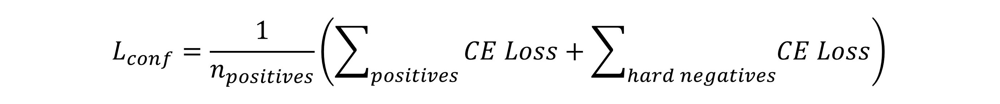


### Note

In our case since we are concerned with detection only i.e 0 : Background Class, 1 : Object Presence Class, we will be using binary cross entropy.

In [13]:
def total_loss(y_true, y_pred):
    y_true = tf.cast(y_true, dtype=tf.float32)
    y_pred = tf.cast(y_pred, dtype=tf.float32)

    # Create a mask for positive samples
    pos_mask = tf.cast(tf.equal(tf.squeeze(y_true[:, :, 4:5], axis=-1), 0.0), tf.float32)
    num_pos = tf.maximum(1.0, tf.cast(tf.math.count_nonzero(pos_mask, axis=-1), tf.float32))

    # Calculate localization loss
    loc_loss = tf.compat.v1.losses.huber_loss(labels=y_true[:, :, :4],
                                              predictions=y_pred[:, :, :4],
                                              reduction="none")
    
    loc_loss = tf.reduce_sum(loc_loss, axis=-1)
    loc_loss = tf.where(tf.equal(pos_mask, 1.0), loc_loss, 0.0)
    loc_loss = tf.reduce_sum(loc_loss, axis=-1)
    loc_loss = loc_loss / num_pos

    # Calculate classification loss
    cce = tf.losses.BinaryCrossentropy(from_logits=True, reduction=tf.losses.Reduction.NONE)
    cross_entropy = cce(y_true[:, :, 4:], y_pred[:, :, 4:])

    # Set negative to positive ratio
    num_neg =  num_pos

    # Perform hard negative mining
    neg_cross_entropy = tf.where(tf.equal(pos_mask, 0.0), cross_entropy, 0.0)
    sorted_dfidx = tf.cast(tf.argsort(neg_cross_entropy, direction='DESCENDING', axis=-1), tf.int32)
    rank = tf.cast(tf.argsort(sorted_dfidx, axis=-1), tf.int32)
    num_neg = tf.cast(num_neg, dtype=tf.int32)
    neg_loss = tf.where(rank < tf.expand_dims(num_neg, axis=1), neg_cross_entropy, 0.0)

    # Calculate positive loss
    pos_loss = tf.where(tf.equal(pos_mask, 1.0), cross_entropy, 0.0)
    clas_loss = tf.reduce_sum(pos_loss + neg_loss, axis=-1)
    clas_loss = clas_loss / num_pos

    # Combine losses
    total_loss = loc_loss + clas_loss
    return total_loss

**Explanation:**

1. **Data Preprocessing:**
   - Cast `y_true` and `y_pred` to `tf.float32` for numerical operations.

2. **Positive Sample Mask:**
   - Create a mask `pos_mask` to identify grid cells containing objects (confidence 0.0).
   - Count the number of positive samples (`num_pos`) for each image, ensuring at least one positive sample.

3. **Localization Loss:**
   - Calculate the Huber loss for the bounding box coordinates using `tf.compat.v1.losses.huber_loss`.
   - Sum the loss across all bounding boxes and grid cells.
   - Apply the positive mask, discarding localization loss for empty grid cells.
   - Normalize the loss by the number of positive samples.

4. **Classification Loss:**
   - Create a `tf.losses.BinaryCrossentropy` object for binary classification.
   - Calculate the cross-entropy loss for each grid cell, considering the confidence score.

5. **Hard Negative Mining:**
   - Extract the negative cross-entropy values using the `pos_mask`.
   - Sort the negative cross-entropy values in descending order to find the most confident negative samples.
   - Rank the negative samples.
   - Select the top `num_neg` negative samples based on their rank. This helps focus the training on the most challenging negative examples.

6. **Positive Loss:**
   - Calculate the positive cross-entropy loss using the `pos_mask`.

7. **Total Loss Calculation:**
   - Combine the localization and classification losses, each normalized by the number of positive samples.

**Key Points:**

- **Hard Negative Mining:** This technique helps improve object detection by focusing training on hard negative samples (those misclassified as objects).
- **Positive Mask:**  The `pos_mask` ensures that localization and classification losses are only calculated for relevant grid cells containing objects.
- **Normalization:** Normalizing the losses by the number of positive samples helps ensure that the model learns equally from both positive and negative examples.


## MODEL


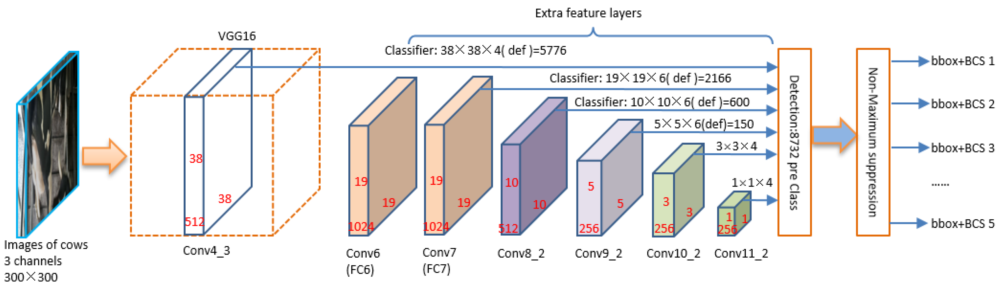

In [14]:
import tensorflow as tf
from tensorflow.keras.layers import Layer, Input, Conv2D, MaxPool2D, Reshape, Concatenate, MaxPooling2D, ZeroPadding2D, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2

from tensorflow.keras.applications.vgg16 import VGG16

l2_reg = l2_regularization = 0.0005

class L2Normalization(Layer):
    """Normalizing different scale features for fusion.
    paper: https://arxiv.org/abs/1506.04579
    inputs:
        feature_map = (batch_size, feature_map_height, feature_map_width, depth)
    outputs:
        normalized_feature_map = (batch_size, feature_map_height, feature_map_width, depth)
    """
    def __init__(self, scale_factor, **kwargs):
        super(L2Normalization, self).__init__(**kwargs)
        self.scale_factor = scale_factor

    def get_config(self):
        config = super(L2Normalization, self).get_config()
        config.update({"scale_factor": self.scale_factor})
        return config

    def build(self, input_shape):
        # Network need to learn scale factor for each channel
        init_scale_factor = tf.fill((input_shape[-1],), float(self.scale_factor))
        self.scale = tf.Variable(init_scale_factor, trainable=True)

    def call(self, inputs):
        return tf.nn.l2_normalize(inputs, axis=-1) * self.scale

def buildSSD_VGG16(n_classes, n_boxes = [4, 6, 6, 6, 4, 4]):
    # base_model = VGG16(weights='imagenet', include_top=False, 
    #                input_shape=(300, 300, 3))

    # conv4_3 = base_model.get_layer('block4_conv3').output

    # pool4 = base_model.get_layer('block4_pool').output

    x = Input(shape=(300, 300, 3))

    conv1_1 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv1_1')(x)
    conv1_2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv1_2')(conv1_1)
    pool1 = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same', name='pool1')(conv1_2)

    conv2_1 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv2_1')(pool1)
    conv2_2 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv2_2')(conv2_1)
    pool2 = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same', name='pool2')(conv2_2)

    conv3_1 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv3_1')(pool2)
    conv3_2 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv3_2')(conv3_1)
    conv3_3 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv3_3')(conv3_2)
    pool3 = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same', name='pool3')(conv3_3)

    conv4_1 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv4_1')(pool3)
    conv4_2 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv4_2')(conv4_1)
    conv4_3 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv4_3')(conv4_2)
    pool4 = MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same', name='pool4')(conv4_3)

    conv5_1 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv5_1')(pool4)
    conv5_2 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv5_2')(conv5_1)
    conv5_3 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv5_3')(conv5_2)
    pool5 = MaxPooling2D(pool_size=(3, 3), strides=(1, 1), padding='same', name='pool5')(conv5_3)

    fc6 = Conv2D(1024, (3, 3), dilation_rate=(6, 6), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='fc6')(pool5)

    fc7 = Conv2D(1024, (1, 1), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='fc7')(fc6)

    conv6_1 = Conv2D(256, (1, 1), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv6_1')(fc7)
    conv6_1 = ZeroPadding2D(padding=((1, 1), (1, 1)), name='conv6_padding')(conv6_1)
    conv6_2 = Conv2D(512, (3, 3), strides=(2, 2), activation='relu', padding='valid', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv6_2')(conv6_1)

    conv7_1 = Conv2D(128, (1, 1), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv7_1')(conv6_2)
    conv7_1 = ZeroPadding2D(padding=((1, 1), (1, 1)), name='conv7_padding')(conv7_1)
    conv7_2 = Conv2D(256, (3, 3), strides=(2, 2), activation='relu', padding='valid', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv7_2')(conv7_1)

    conv8_1 = Conv2D(128, (1, 1), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv8_1')(conv7_2)
    conv8_2 = Conv2D(256, (3, 3), strides=(1, 1), activation='relu', padding='valid', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv8_2')(conv8_1)

    conv9_1 = Conv2D(128, (1, 1), activation='relu', padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv9_1')(conv8_2)
    conv9_2 = Conv2D(256, (3, 3), strides=(1, 1), activation='relu', padding='valid', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv9_2')(conv9_1)

    # Feed conv4_3 into the L2 normalization layer
    conv4_3_norm = L2Normalization(scale_factor=20, name='conv4_3_norm')(conv4_3)

    ### Build the convolutional predictor layers on top of the base network

    # We precidt `n_classes` confidence values for each box, hence the confidence predictors have depth `n_boxes * n_classes`
    # Output shape of the confidence layers: `(batch, height, width, n_boxes * n_classes)`
    conv4_3_norm_mbox_conf = Conv2D(n_boxes[0] * n_classes, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv4_3_norm_mbox_conf')(conv4_3_norm)
    fc7_mbox_conf = Conv2D(n_boxes[1] * n_classes, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='fc7_mbox_conf')(fc7)
    conv6_2_mbox_conf = Conv2D(n_boxes[2] * n_classes, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv6_2_mbox_conf')(conv6_2)
    conv7_2_mbox_conf = Conv2D(n_boxes[3] * n_classes, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv7_2_mbox_conf')(conv7_2)
    conv8_2_mbox_conf = Conv2D(n_boxes[4] * n_classes, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv8_2_mbox_conf')(conv8_2)
    conv9_2_mbox_conf = Conv2D(n_boxes[5] * n_classes, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv9_2_mbox_conf')(conv9_2)
    # We predict 4 box coordinates for each box, hence the localization predictors have depth `n_boxes * 4`
    # Output shape of the localization layers: `(batch, height, width, n_boxes * 4)`
    conv4_3_norm_mbox_loc = Conv2D(n_boxes[0] * 4, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv4_3_norm_mbox_loc')(conv4_3_norm)
    fc7_mbox_loc = Conv2D(n_boxes[1] * 4, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='fc7_mbox_loc')(fc7)
    conv6_2_mbox_loc = Conv2D(n_boxes[2] * 4, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv6_2_mbox_loc')(conv6_2)
    conv7_2_mbox_loc = Conv2D(n_boxes[3] * 4, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv7_2_mbox_loc')(conv7_2)
    conv8_2_mbox_loc = Conv2D(n_boxes[4] * 4, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv8_2_mbox_loc')(conv8_2)
    conv9_2_mbox_loc = Conv2D(n_boxes[5] * 4, (3, 3), padding='same', kernel_initializer='he_normal', kernel_regularizer=l2(l2_reg), name='conv9_2_mbox_loc')(conv9_2)

    conv4_3_norm_mbox_conf_reshape = Reshape((-1, n_classes), name='conv4_3_norm_mbox_conf_reshape')(conv4_3_norm_mbox_conf)
    fc7_mbox_conf_reshape = Reshape((-1, n_classes), name='fc7_mbox_conf_reshape')(fc7_mbox_conf)
    conv6_2_mbox_conf_reshape = Reshape((-1, n_classes), name='conv6_2_mbox_conf_reshape')(conv6_2_mbox_conf)
    conv7_2_mbox_conf_reshape = Reshape((-1, n_classes), name='conv7_2_mbox_conf_reshape')(conv7_2_mbox_conf)
    conv8_2_mbox_conf_reshape = Reshape((-1, n_classes), name='conv8_2_mbox_conf_reshape')(conv8_2_mbox_conf)
    conv9_2_mbox_conf_reshape = Reshape((-1, n_classes), name='conv9_2_mbox_conf_reshape')(conv9_2_mbox_conf)

    conv4_3_norm_mbox_loc_reshape = Reshape((-1, 4), name='conv4_3_norm_mbox_loc_reshape')(conv4_3_norm_mbox_loc)
    fc7_mbox_loc_reshape = Reshape((-1, 4), name='fc7_mbox_loc_reshape')(fc7_mbox_loc)
    conv6_2_mbox_loc_reshape = Reshape((-1, 4), name='conv6_2_mbox_loc_reshape')(conv6_2_mbox_loc)
    conv7_2_mbox_loc_reshape = Reshape((-1, 4), name='conv7_2_mbox_loc_reshape')(conv7_2_mbox_loc)
    conv8_2_mbox_loc_reshape = Reshape((-1, 4), name='conv8_2_mbox_loc_reshape')(conv8_2_mbox_loc)
    conv9_2_mbox_loc_reshape = Reshape((-1, 4), name='conv9_2_mbox_loc_reshape')(conv9_2_mbox_loc)

    mbox_conf = Concatenate(axis=1, name='mbox_conf')([conv4_3_norm_mbox_conf_reshape,
                                                        fc7_mbox_conf_reshape,
                                                        conv6_2_mbox_conf_reshape,
                                                        conv7_2_mbox_conf_reshape,
                                                        conv8_2_mbox_conf_reshape,
                                                        conv9_2_mbox_conf_reshape])

    mbox_loc = Concatenate(axis=1, name='mbox_loc')([conv4_3_norm_mbox_loc_reshape,
                                                        fc7_mbox_loc_reshape,
                                                        conv6_2_mbox_loc_reshape,
                                                        conv7_2_mbox_loc_reshape,
                                                        conv8_2_mbox_loc_reshape,
                                                        conv9_2_mbox_loc_reshape])

    mbox_conf_sigmoid = Activation('sigmoid', name='mbox_conf_sigmoid')(mbox_conf)

    # input = base_model.input

    ssd_VGG16 = Model(inputs=x, outputs=[mbox_loc, mbox_conf_sigmoid])

#     if model_checkpoint != None:
#         ssd_VGG16.load_weights(model_checkpoint)

    return ssd_VGG16

In [15]:
def SSD():
    
    inputs = Input((300,300,3))
    
    model = buildSSD_VGG16(n_classes=1)
    
    loc,clas = model(inputs)
    
    pred = tf.concat([loc,clas],axis=-1)
    
    return Model(inputs=[inputs], outputs=[pred])

model = SSD()
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 300, 300, 3)]        0         []                            
                                                                                                  
 model (Functional)          [(None, 8732, 4),            2361224   ['input_1[0][0]']             
                              (None, 8732, 1)]            6                                       
                                                                                                  
 tf.concat (TFOpLambda)      (None, 8732, 5)              0         ['model[0][0]',               
                                                                     'model[0][1]']               
                                                                                            

In [16]:
final_images = tf.cast(images,tf.float32)

model.compile(optimizer='adam',loss=total_loss)

In [19]:
model.fit(final_images,final_coord, epochs=3)

Epoch 1/3


2024-06-17 16:19:26.195610: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


32/32 [==============================] - 93s 3s/step - loss: 1.8756
Epoch 2/3
32/32 [==============================] - 92s 3s/step - loss: 1.8746
Epoch 3/3
32/32 [==============================] - 92s 3s/step - loss: 1.8764


In [ ]:
#model.save('SSD300 P1.h5')

In [21]:
from tensorflow.keras.utils import CustomObjectScope

with CustomObjectScope({'L2Normalization': L2Normalization,'total_loss': total_loss}):
    models2 = tf.keras.models.load_model('SSD300 P1.h5')

## Predictions

1/1 [==============================] - 0s 249ms/step


2024-06-17 16:24:43.984348: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


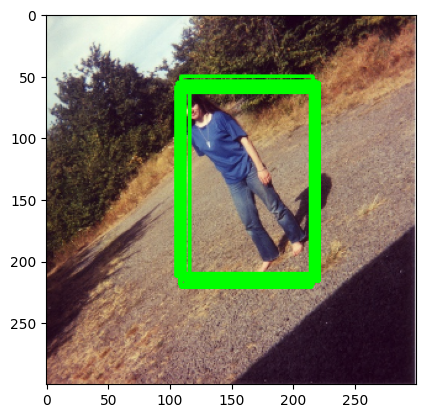

1/1 [==============================] - 0s 42ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


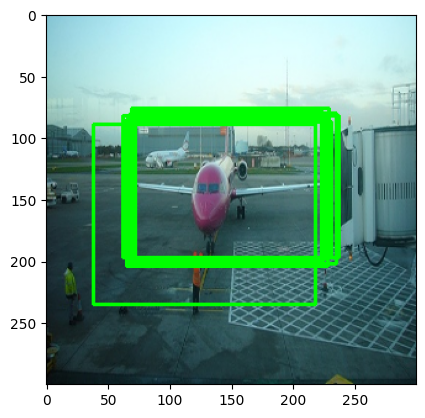

1/1 [==============================] - 0s 63ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


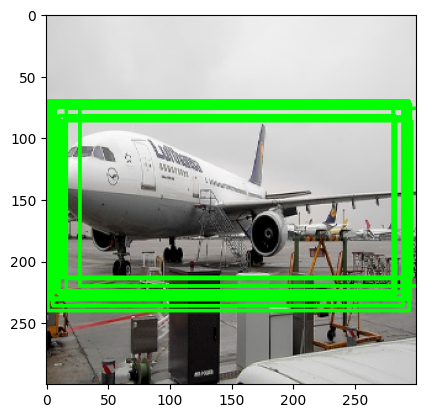

1/1 [==============================] - 0s 44ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


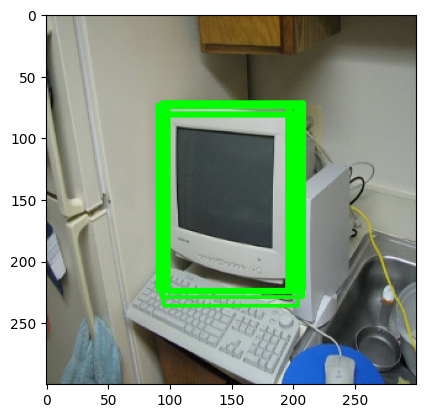

1/1 [==============================] - 0s 59ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


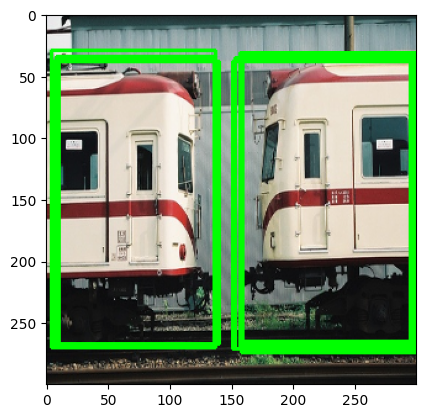

1/1 [==============================] - 0s 48ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


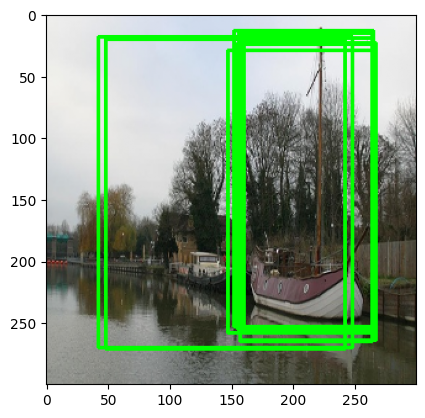

1/1 [==============================] - 0s 42ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


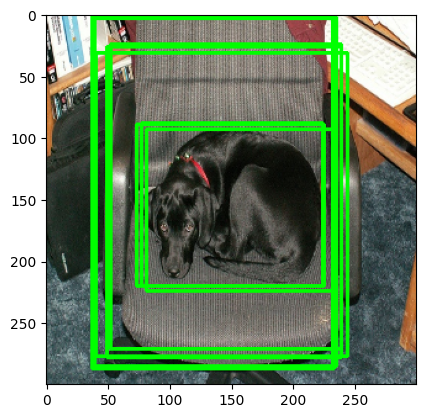

1/1 [==============================] - 0s 57ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


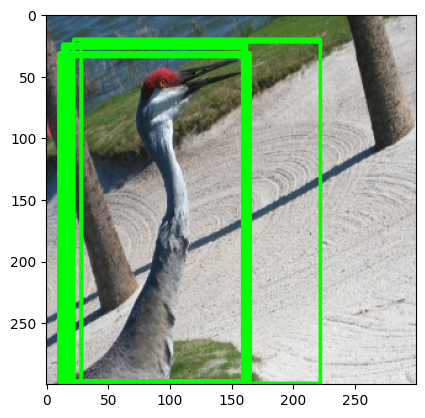

1/1 [==============================] - 0s 56ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


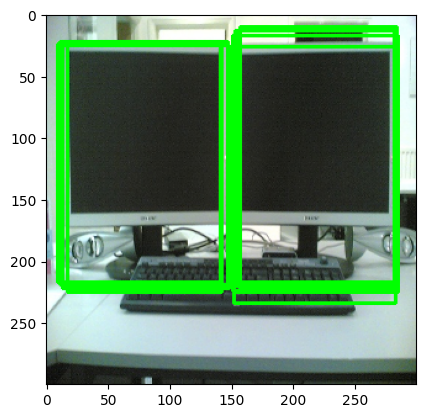

1/1 [==============================] - 0s 53ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


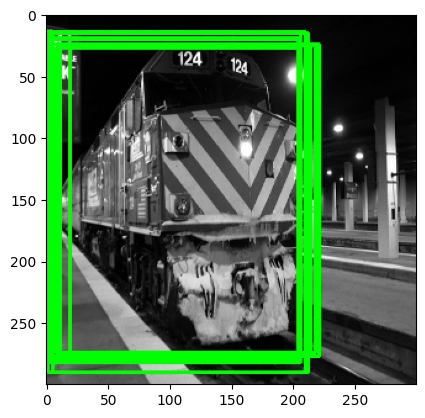

1/1 [==============================] - 0s 38ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


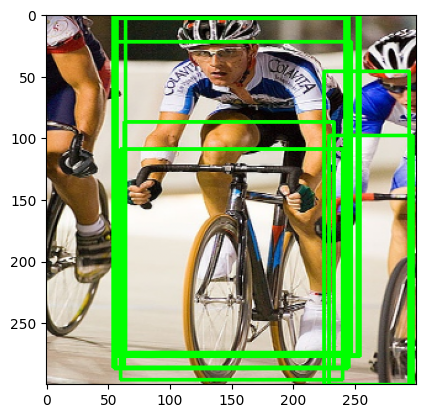

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


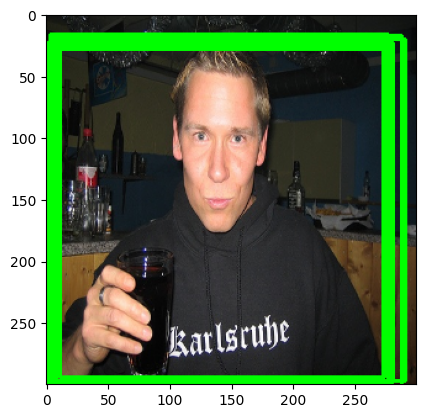

1/1 [==============================] - 0s 44ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


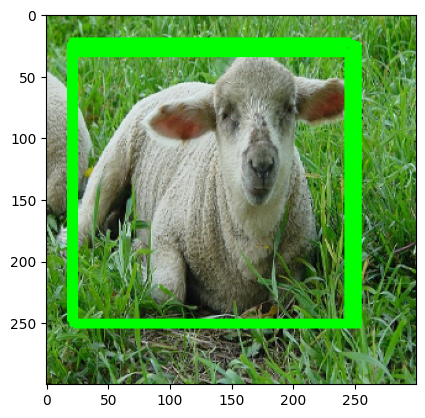

1/1 [==============================] - 0s 57ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


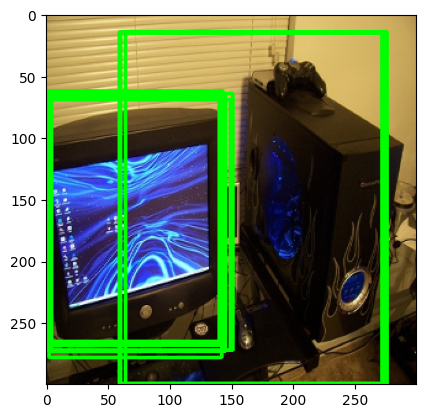

1/1 [==============================] - 0s 59ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


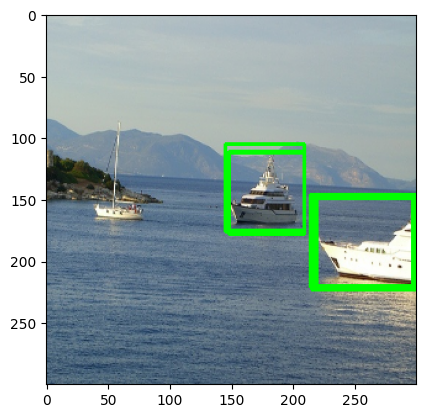

1/1 [==============================] - 0s 57ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


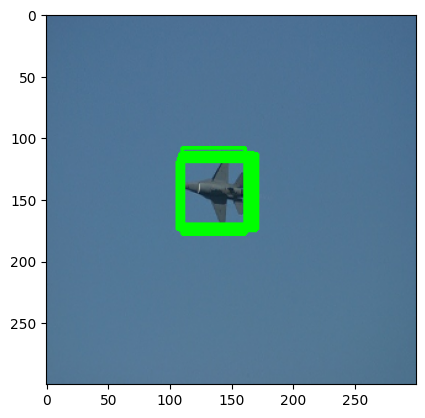

1/1 [==============================] - 0s 36ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


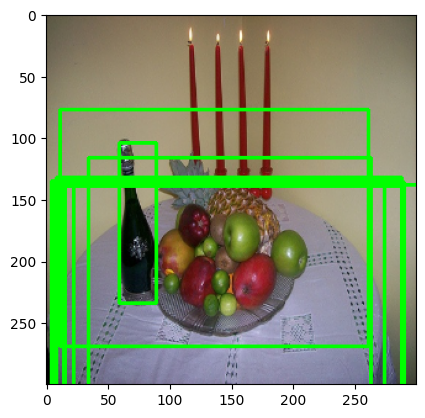

1/1 [==============================] - 0s 40ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


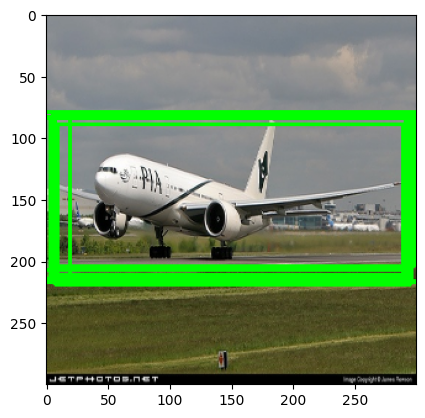

1/1 [==============================] - 0s 50ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


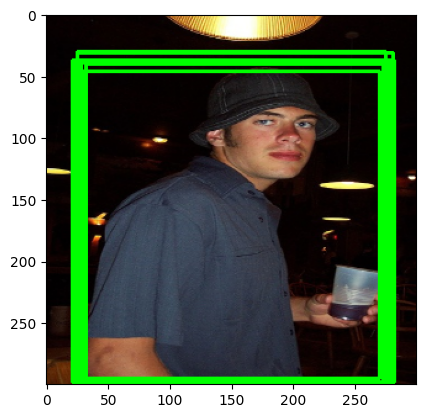

1/1 [==============================] - 0s 44ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


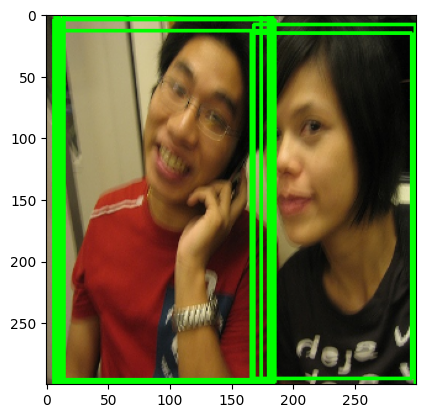

1/1 [==============================] - 0s 53ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


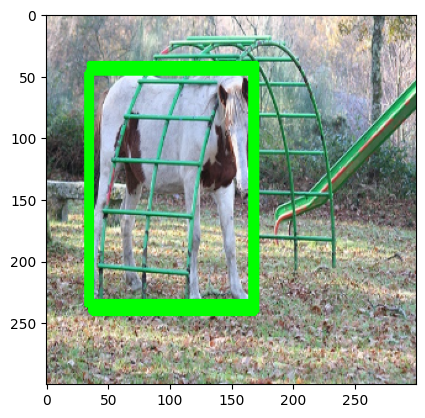

1/1 [==============================] - 0s 63ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


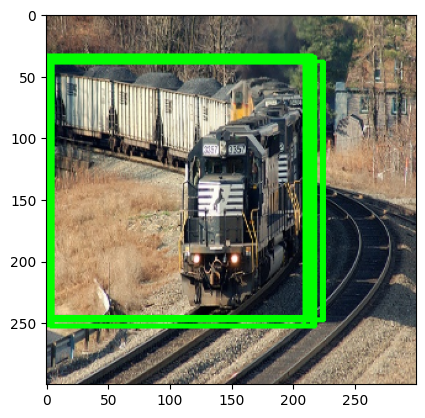

1/1 [==============================] - 0s 54ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


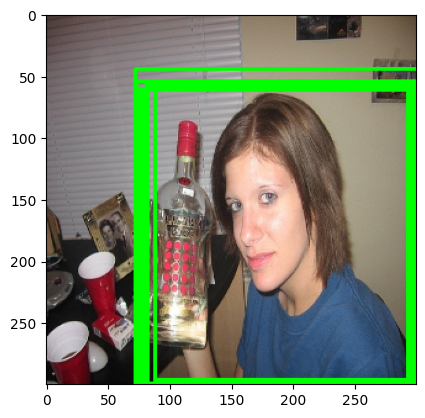

1/1 [==============================] - 0s 50ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


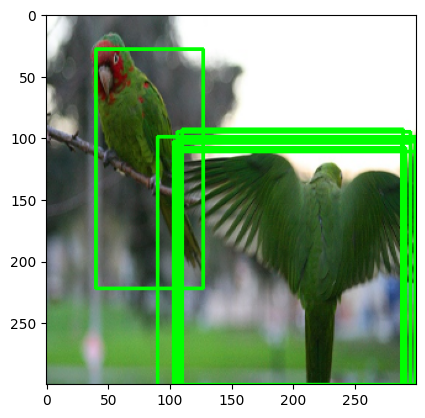

1/1 [==============================] - 0s 45ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


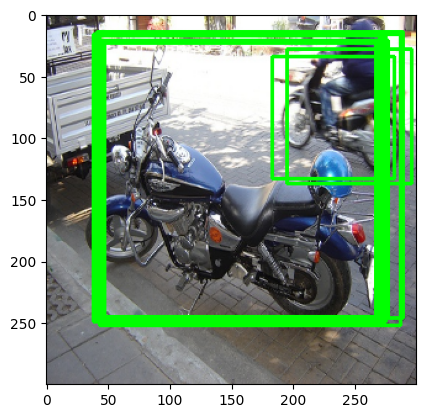

1/1 [==============================] - 0s 56ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


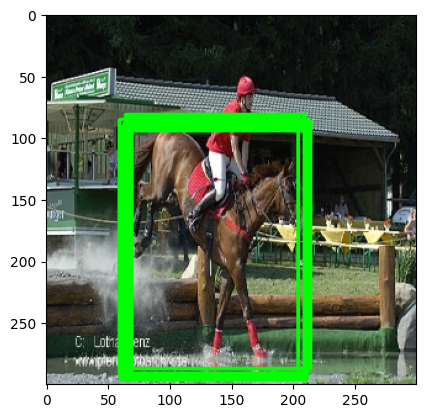

1/1 [==============================] - 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


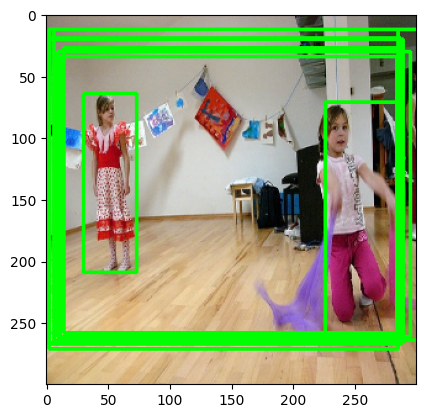

1/1 [==============================] - 0s 54ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


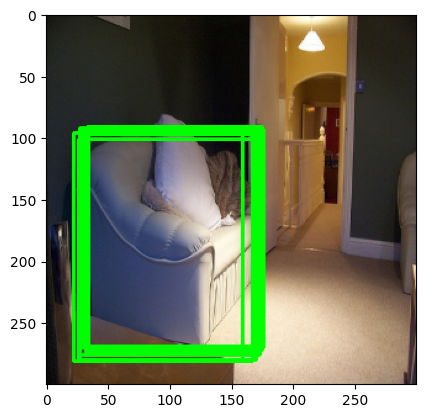

1/1 [==============================] - 0s 48ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


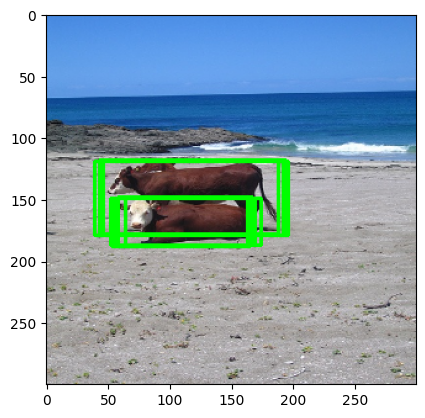

1/1 [==============================] - 0s 44ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


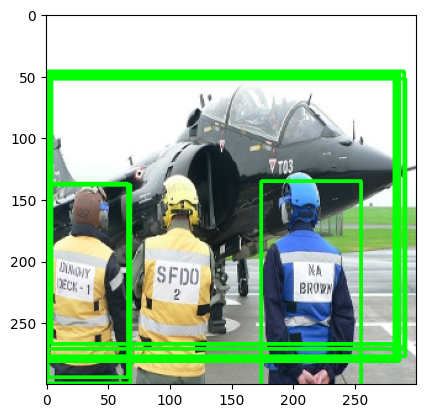

In [22]:
for i in range(0,30):
    
    model_predictions = models2.predict(images[i:i+1])  

    boxes = normalised_ground_truth(model_predictions[0][:,:4], priors, 'decode')
    classes = model_predictions[...,4][0]
    idx = np.argsort(classes)[:10]      # take only 10 predicted bounding boxes. We select with the lowest score since during encoding the true class was 0 and background class as 1.
    boxes = tf.gather(boxes,idx)*300

    xmin = boxes[:,0] - boxes[:,2]/2
    ymin = boxes[:,1] - boxes[:,3]/2

    xmax = boxes[:,0] + boxes[:,2]/2
    ymax = boxes[:,1] + boxes[:,3]/2

    fp = np.vstack((xmin,ymin,xmax,ymax)).T


    image = images[i].copy()

    for bbox in fp:
        # Extract bounding box coordinates and class index.
        x_min, y_min,x_max, y_max = bbox


        # Draw bounding box rectangle on the image.
        cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    plt.imshow(image)
    plt.show()

## Out of bound predictions

Since we trained only on 1000 images, lets see how it performs on remaining 

0
1/1 [==============================] - 0s 55ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


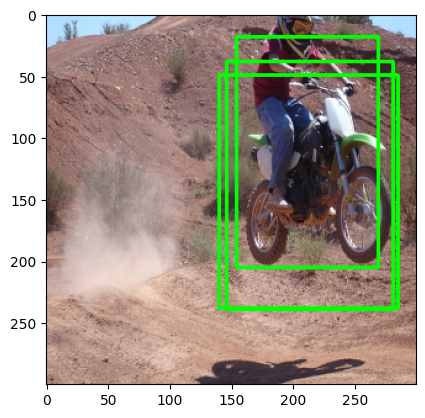

1
1/1 [==============================] - 0s 40ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


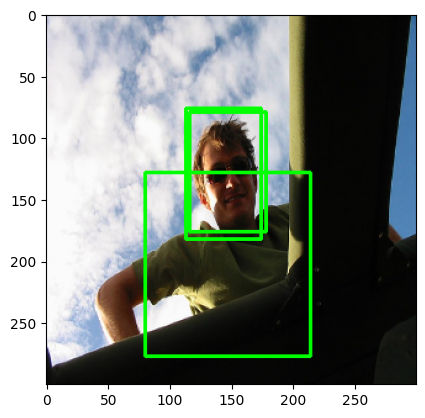

2
1/1 [==============================] - 0s 45ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


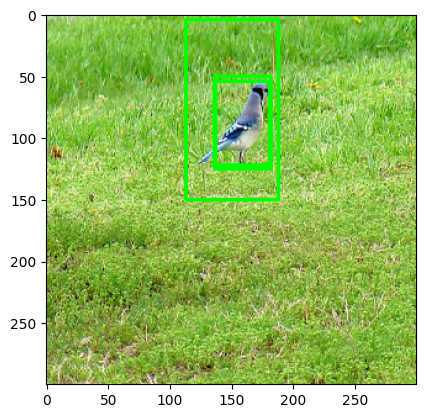

3
1/1 [==============================] - 0s 48ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


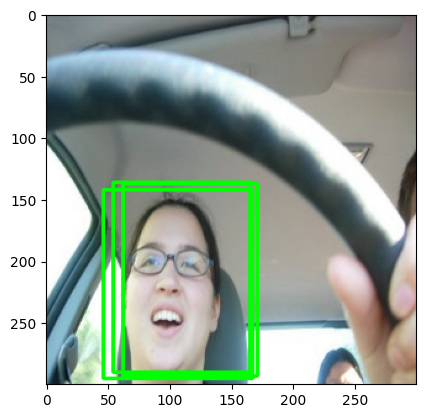

4
1/1 [==============================] - 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


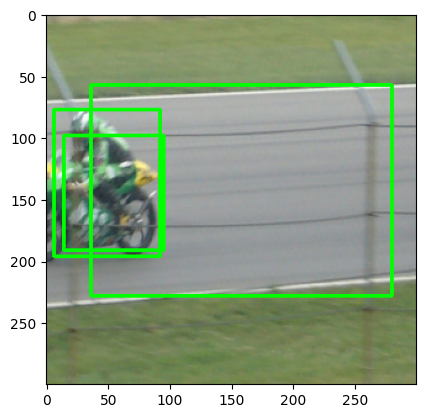

5
1/1 [==============================] - 0s 50ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


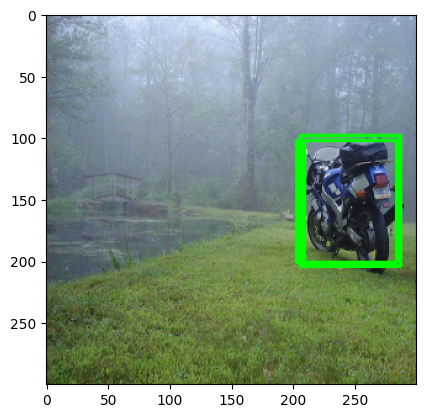

6
1/1 [==============================] - 0s 38ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


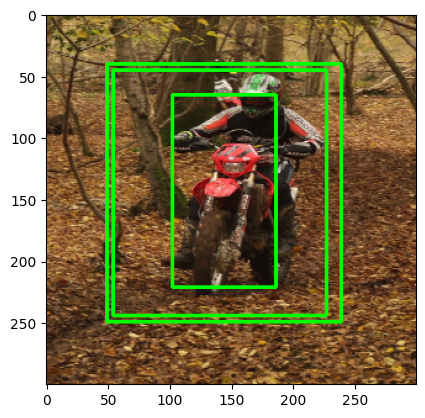

7
1/1 [==============================] - 0s 51ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


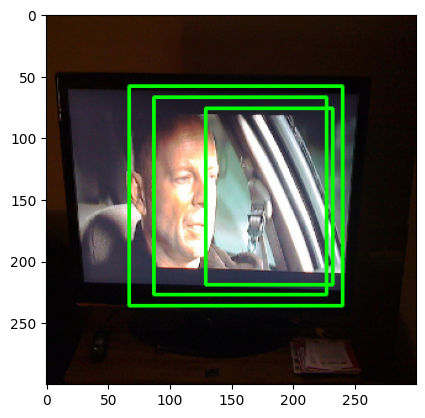

8
1/1 [==============================] - 0s 43ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


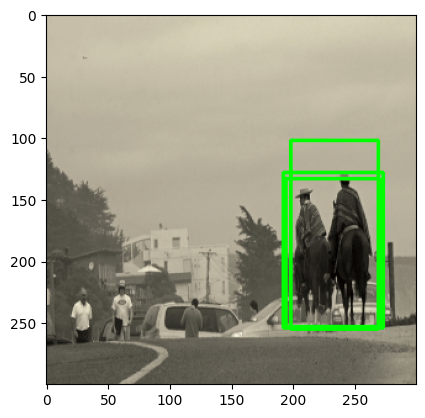

9
1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


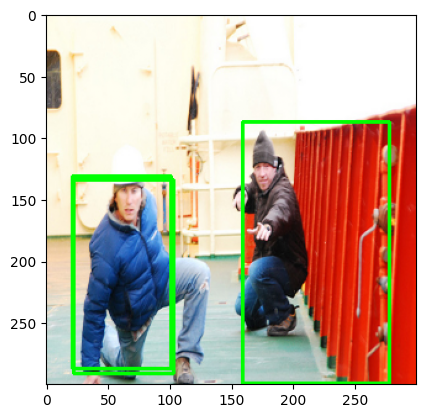

10
1/1 [==============================] - 0s 53ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


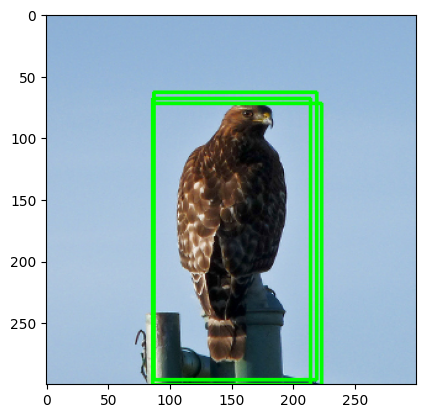

11
1/1 [==============================] - 0s 50ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


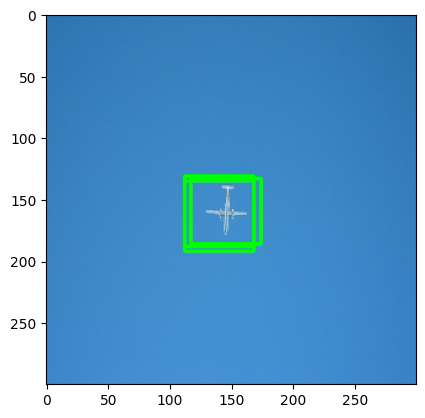

12
1/1 [==============================] - 0s 54ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


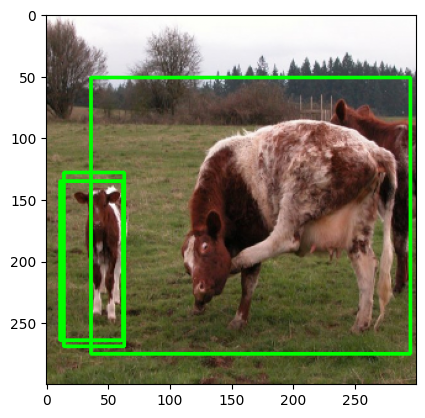

13
1/1 [==============================] - 0s 49ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


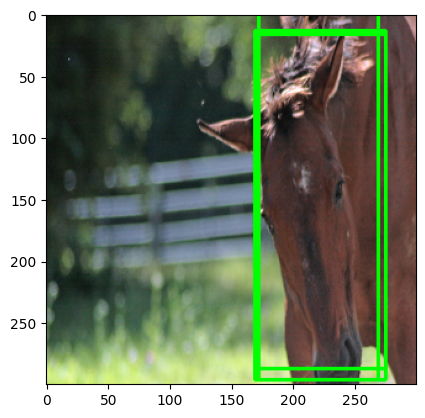

14
1/1 [==============================] - 0s 53ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


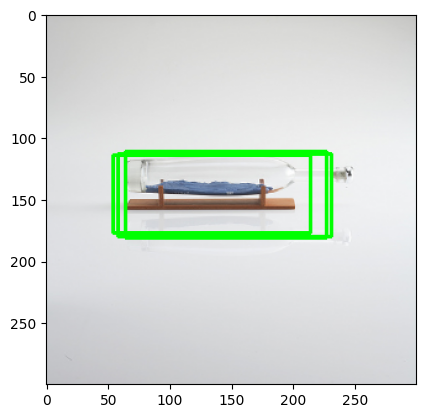

In [23]:
images2 = []
for j in [3041,3046,3085,3087,3093,6004,6007,6058,7018,7070,7090,7228,7239,7292,7286]:
    
    img,attr = fun(train_image[j],300,300)
    images2.append(img)
    
images2 = np.array(images2)

for i in range(len(images2)):
    
    print(i)
    
    model_predictions = models2.predict(images2[i:i+1])

    boxes = normalised_ground_truth(model_predictions[0][:,:4], priors, 'decode')
    classes = model_predictions[...,4][0]
    idx = np.argsort(classes)[:3]
    boxes = tf.gather(boxes,idx)*300

    xmin = boxes[:,0] - boxes[:,2]/2
    ymin = boxes[:,1] - boxes[:,3]/2

    xmax = boxes[:,0] + boxes[:,2]/2
    ymax = boxes[:,1] + boxes[:,3]/2

    fp = np.vstack((xmin,ymin,xmax,ymax)).T


    image = images2[i].copy()

    for bbox in fp:
        # Extract bounding box coordinates and class index.
        x_min, y_min,x_max, y_max = bbox


        # Draw bounding box rectangle on the image.
        cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    plt.imshow(image)
    plt.show()